### Here we project the hopping operators, and add the on-site operators as-is. In other words, we commute the order of their addition and projection.

In [1]:
using Plots
using LinearAlgebra
using LaTeXStrings
using StatsBase
using CSV
using DataFrames

In [2]:
t_start = time();

## Parameters:

In [4]:
t0 = 1.0;
t = 1.0;
m_0 = 0.0;
mu = 1.2;
Delta = 0.5;

x_periodic = 1;
y_periodic = 1;

L = 108;

Lx = L;
Ly = L;

exportdata=1;

Equation of two lines are $y = mx + c_1$ and $y = mx + c_2$

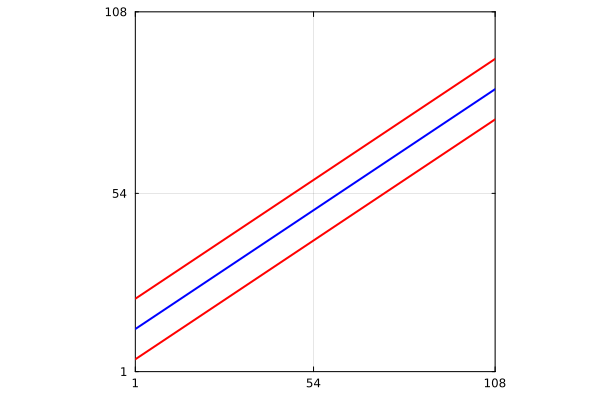

In [5]:
# m = (-1+sqrt(5))/2
m=2/3;
c1 = 4
c2 = 22

function line_down(x::Float64)
    return c1 + m*x
end

function line_up(x::Float64)
    return c2 + m*x
end

function line_middle(x::Float64)
    return (line_up(x) + line_down(x))/2
end

line_x = [1.0,L]
line_down_y = line_down.(line_x)
line_up_y = line_up.(line_x)

plot(line_x,line_down_y,color="red",width=2, xlims=(1,Lx),ylims=(1,Ly),legend=:none,aspect_ratio=:equal,frame=:box, framestyle=:thick,xticks=[1,Lx/2,Lx],yticks=[1,Ly/2,Ly])
plot!(line_x,line_up_y,color="red",width=2)
plot!(line_x,line_middle.(line_x),color="blue",width=2)

In [6]:
points_x_array = range(1, L,L)
points_y_array = range(1, L,L)

points2 = zeros(2*L^2)
for ii = 1:L
    for jj = 1:L
        points2[2*((jj-1)*L+ii)-1] = points_x_array[ii]
        points2[2*((jj-1)*L+ii)] = points_y_array[jj]
    end
end


### These arrays have N^2 elements, and hold the x and y coordinates of nth site
points_x_array = points2[1:2:end]
points_y_array =  points2[2:2:end]

site_index = range(1,L^2, L^2)

1.0:1.0:11664.0

### Now we isolate the PTB points

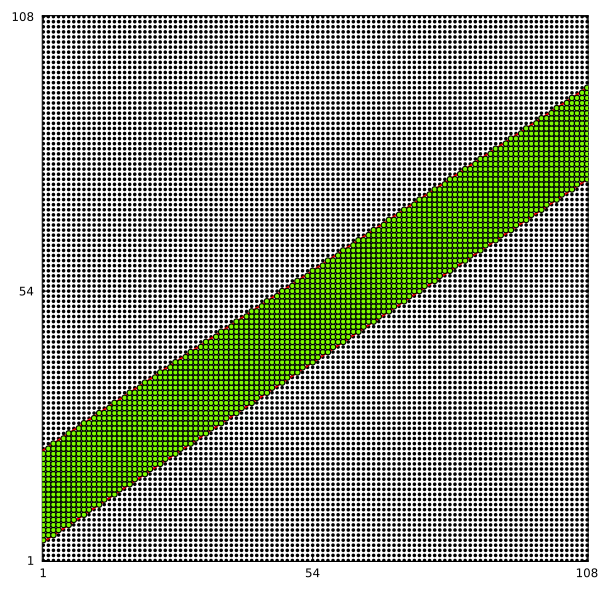

In [7]:
### PTB_index will contain ordered indices of the sites in PTB

PTB_index_dummy = collect(range(1,L^2,L^2))
for ii = 1:L^2
    if (points_y_array[ii] >= line_down(points_x_array[ii])) && (points_y_array[ii] <= line_up(points_x_array[ii]))
        ## Do nothing
    else
        PTB_index_dummy[ii] = 0.0
    end
end

## Here we store non-zero indices
PTB_index = findall(!iszero, PTB_index_dummy)

N_PTB = size(PTB_index)[1]

points_PTB_array_x = zeros(N_PTB)
points_PTB_array_y = zeros(N_PTB)

for ii = 1:N_PTB
    points_PTB_array_x[ii] = points_x_array[PTB_index[ii]]
    points_PTB_array_y[ii] = points_y_array[PTB_index[ii]]
end

### Draw lines separating PTB
line_x = [1.0,L]
line_down_y = line_down.(line_x)
line_up_y = line_up.(line_x)

plt_lattice=scatter(points_x_array, points_y_array,aspect_ratio=1,legend=false, 
                    xlims=[0.8,L+0.2], ylims=[0.8,L+0.2],color="black",markersize=2, frame=:box, framestyle=:thick, xticks=[1,Lx/2,Lx],yticks=[1,Ly/2,Ly], size=(600,600))
plt_lattice=plot!(line_x,line_down_y,color="red",width=2)
plt_lattice=plot!(line_x,line_up_y,color="red",width=2)
plt_lattice=plot!(line_x,line_middle.(line_x),color="blue",width=2)
plt_lattice=scatter!(points_PTB_array_x, points_PTB_array_y,color="lawngreen",aspect_ratio=1,legend=false,markersize=3)

## Percentage of sites in PTB

In [8]:
println("Number of sites in PTB = ",N_PTB)
println("Amount of sites in PTB = ",100* N_PTB/L^2, " %")

Number of sites in PTB = 1980
Amount of sites in PTB = 16.97530864197531 %


In [9]:
println(PTB_index)

[433, 541, 542, 543, 649, 650, 651, 652, 757, 758, 759, 760, 761, 762, 865, 866, 867, 868, 869, 870, 871, 973, 974, 975, 976, 977, 978, 979, 980, 981, 1081, 1082, 1083, 1084, 1085, 1086, 1087, 1088, 1089, 1090, 1189, 1190, 1191, 1192, 1193, 1194, 1195, 1196, 1197, 1198, 1199, 1200, 1297, 1298, 1299, 1300, 1301, 1302, 1303, 1304, 1305, 1306, 1307, 1308, 1309, 1405, 1406, 1407, 1408, 1409, 1410, 1411, 1412, 1413, 1414, 1415, 1416, 1417, 1418, 1419, 1513, 1514, 1515, 1516, 1517, 1518, 1519, 1520, 1521, 1522, 1523, 1524, 1525, 1526, 1527, 1528, 1621, 1622, 1623, 1624, 1625, 1626, 1627, 1628, 1629, 1630, 1631, 1632, 1633, 1634, 1635, 1636, 1637, 1638, 1729, 1730, 1731, 1732, 1733, 1734, 1735, 1736, 1737, 1738, 1739, 1740, 1741, 1742, 1743, 1744, 1745, 1746, 1747, 1837, 1838, 1839, 1840, 1841, 1842, 1843, 1844, 1845, 1846, 1847, 1848, 1849, 1850, 1851, 1852, 1853, 1854, 1855, 1856, 1857, 1945, 1946, 1947, 1948, 1949, 1950, 1951, 1952, 1953, 1954, 1955, 1956, 1957, 1958, 1959, 1960, 1961, 196

## Coordinates of projected sites

### Equation of line_down is $y=mx + c_1$
### Equation of projector line is, $y-y_1 = (-1/m).(x-x_1)$, where $(x_1,y_1)$ is the coordinate of the site
### The two lines intersect at $((m.y_1 + x_1 - m.c_1)/(m^2 + 1), (m^2.y_1 + m.x_1 + c_1)/(m^2 + 1))$

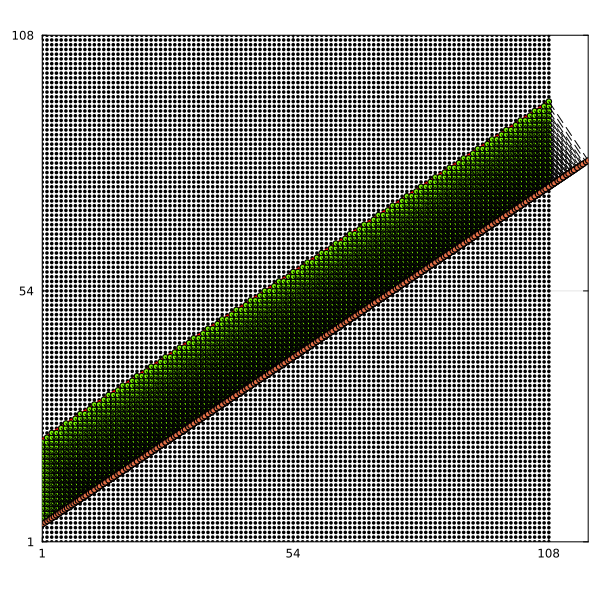

In [10]:
projected_points_PTB_array_x = (m*points_PTB_array_y + points_PTB_array_x - m*ones(N_PTB)*c1)/(m^2 + 1);
projected_points_PTB_array_y = m*projected_points_PTB_array_x + c1 * ones(N_PTB);

## This array contains distance along the line
## This should be x coordinates on the line * sec(theta), where the slope is tan(theta) = m
distance_along_projected_line = projected_points_PTB_array_x * sqrt(m^2 +1)

for ii = 1:N_PTB
    line_projected_x = [points_PTB_array_x[ii],projected_points_PTB_array_x[ii]]
    line_projected_y = [points_PTB_array_y[ii],projected_points_PTB_array_y[ii]]
    plt_lattice=plot!(line_projected_x,line_projected_y,linestyle=:dash, color="black")
end
plt_lattice=scatter!(projected_points_PTB_array_x,projected_points_PTB_array_y, 
            xlims=(1,maximum(vcat(projected_points_PTB_array_x,Lx))), ylims=(1,maximum(vcat(projected_points_PTB_array_y,Ly))), markersize=3)
display(plt_lattice)

## Generate Parent Hamiltonian

In [11]:
include("generate_matrices1D.jl")
include("generate_matrices2D.jl")
include("angmom.jl")

generate_spin_matrices (generic function with 1 method)

In [12]:
println("t = ",t)
println("m_0 = ", m_0)
println("Delta = ",Delta)
println("mu = ", mu)
println("Lx = ", Lx)
println("Ly = ", Ly)

t = 1.0
m_0 = 0.0
Delta = 0.5
mu = 1.2
Lx = 108
Ly = 108


In [13]:
if(x_periodic^2 != x_periodic || y_periodic^2 != y_periodic)
    println("x_periodic and y_periodic must be 0 or 1")
    println("You entered x_periodic = ", x_periodic, " y_periodic = ", y_periodic)
    return
end

In [14]:
sigma_x = [0 1;
           1 0];
sigma_y = [0 -im;
           im 0];
sigma_z = [1 0;
           0 -1];
eye2 = [1 0;
        0 1];
gamma_01 = kron(eye2, sigma_x);
gamma_02 = kron(eye2, sigma_y);
gamma_03 = kron(eye2, sigma_z);
gamma_13 = kron(sigma_x,sigma_z);
gamma_30 = kron(sigma_z, eye2);
gamma_31 = kron(sigma_z, sigma_x);
gamma_32 = kron(sigma_z, sigma_y);
gamma_33 = kron(sigma_z, sigma_z);

In [15]:
const_2D, CX2D, SX2D, CY2D, SY2D, CXCY2D, SXCY2D, CXSY2D = generate_matrices_2D(Lx,Ly,x_periodic,y_periodic)

CXCY2D= Nothing
SXCY2D= Nothing
CXSY2D= Nothing

Verified: Building Block Matrices are Hermitian


Nothing

In [ ]:
h_SC_chern_without_on_site = t*kron(SX2D,gamma_01) + t*kron(SY2D,gamma_02) + kron(m_0*const_2D- t0*(CX2D + CY2D),gamma_03) #+ Delta*kron(const_2D,gamma_13) -mu*kron(const_2D,gamma_30)


46656×46656 Matrix{ComplexF64}:
  0.0+0.0im  0.0+0.0im   0.0+0.0im  …  0.0+0.0im   0.0+0.0im  0.0+0.0im
  0.0+0.0im  0.0+0.0im   0.0+0.0im     0.0+0.0im   0.0+0.0im  0.0+0.0im
  0.0+0.0im  0.0+0.0im   0.0+0.0im     0.0+0.0im   0.0+0.0im  0.0+0.0im
  0.0+0.0im  0.0+0.0im   0.0+0.0im     0.0+0.0im   0.0+0.0im  0.0+0.0im
 -0.5+0.0im  0.0-0.5im   0.0+0.0im     0.0+0.0im   0.0+0.0im  0.0+0.0im
  0.0-0.5im  0.5+0.0im   0.0+0.0im  …  0.0+0.0im   0.0+0.0im  0.0+0.0im
  0.0+0.0im  0.0+0.0im  -0.5+0.0im     0.0+0.0im   0.0+0.0im  0.0+0.0im
  0.0+0.0im  0.0+0.0im   0.0-0.5im     0.0+0.0im   0.0+0.0im  0.0+0.0im
  0.0+0.0im  0.0+0.0im   0.0+0.0im     0.0+0.0im   0.0+0.0im  0.0+0.0im
  0.0+0.0im  0.0+0.0im   0.0+0.0im     0.0+0.0im   0.0+0.0im  0.0+0.0im
     ⋮                              ⋱                            ⋮
  0.0+0.0im  0.0+0.0im   0.0+0.0im     0.0+0.0im   0.0+0.0im  0.0+0.0im
  0.0+0.0im  0.0+0.0im   0.0+0.0im     0.0+0.5im   0.0+0.0im  0.0+0.0im
  0.0+0.0im  0.0+0.0im   0.0+0.0im   

## Clear Variables

In [22]:
const_2D= Nothing
CX2D= Nothing
SX2D= Nothing
CY2D= Nothing
SY2D= Nothing
CXCY2D= Nothing
SXCY2D= Nothing
CXSY2D= Nothing

Nothing

## Now generate PTB Hamiltonian

In [23]:
PTB_orbital_index = ones(4*N_PTB);
for ii = 1:N_PTB
    PTB_orbital_index[4*ii-3] = 4*PTB_index[ii]-3
    PTB_orbital_index[4*ii-2] = 4*PTB_index[ii]-2
    PTB_orbital_index[4*ii-1] = 4*PTB_index[ii]-1
    PTB_orbital_index[4*ii] = 4*PTB_index[ii]
end
println(PTB_orbital_index)

[1729.0, 1730.0, 1731.0, 1732.0, 2161.0, 2162.0, 2163.0, 2164.0, 2165.0, 2166.0, 2167.0, 2168.0, 2169.0, 2170.0, 2171.0, 2172.0, 2593.0, 2594.0, 2595.0, 2596.0, 2597.0, 2598.0, 2599.0, 2600.0, 2601.0, 2602.0, 2603.0, 2604.0, 2605.0, 2606.0, 2607.0, 2608.0, 3025.0, 3026.0, 3027.0, 3028.0, 3029.0, 3030.0, 3031.0, 3032.0, 3033.0, 3034.0, 3035.0, 3036.0, 3037.0, 3038.0, 3039.0, 3040.0, 3041.0, 3042.0, 3043.0, 3044.0, 3045.0, 3046.0, 3047.0, 3048.0, 3457.0, 3458.0, 3459.0, 3460.0, 3461.0, 3462.0, 3463.0, 3464.0, 3465.0, 3466.0, 3467.0, 3468.0, 3469.0, 3470.0, 3471.0, 3472.0, 3473.0, 3474.0, 3475.0, 3476.0, 3477.0, 3478.0, 3479.0, 3480.0, 3481.0, 3482.0, 3483.0, 3484.0, 3889.0, 3890.0, 3891.0, 3892.0, 3893.0, 3894.0, 3895.0, 3896.0, 3897.0, 3898.0, 3899.0, 3900.0, 3901.0, 3902.0, 3903.0, 3904.0, 3905.0, 3906.0, 3907.0, 3908.0, 3909.0, 3910.0, 3911.0, 3912.0, 3913.0, 3914.0, 3915.0, 3916.0, 3917.0, 3918.0, 3919.0, 3920.0, 3921.0, 3922.0, 3923.0, 3924.0, 4321.0, 4322.0, 4323.0, 4324.0, 4325.0,

In [24]:
outside_orbital_index = setdiff(1:4*Lx*Ly,PTB_orbital_index);
println(outside_orbital_index)

[1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 12.0, 13.0, 14.0, 15.0, 16.0, 17.0, 18.0, 19.0, 20.0, 21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27.0, 28.0, 29.0, 30.0, 31.0, 32.0, 33.0, 34.0, 35.0, 36.0, 37.0, 38.0, 39.0, 40.0, 41.0, 42.0, 43.0, 44.0, 45.0, 46.0, 47.0, 48.0, 49.0, 50.0, 51.0, 52.0, 53.0, 54.0, 55.0, 56.0, 57.0, 58.0, 59.0, 60.0, 61.0, 62.0, 63.0, 64.0, 65.0, 66.0, 67.0, 68.0, 69.0, 70.0, 71.0, 72.0, 73.0, 74.0, 75.0, 76.0, 77.0, 78.0, 79.0, 80.0, 81.0, 82.0, 83.0, 84.0, 85.0, 86.0, 87.0, 88.0, 89.0, 90.0, 91.0, 92.0, 93.0, 94.0, 95.0, 96.0, 97.0, 98.0, 99.0, 100.0, 101.0, 102.0, 103.0, 104.0, 105.0, 106.0, 107.0, 108.0, 109.0, 110.0, 111.0, 112.0, 113.0, 114.0, 115.0, 116.0, 117.0, 118.0, 119.0, 120.0, 121.0, 122.0, 123.0, 124.0, 125.0, 126.0, 127.0, 128.0, 129.0, 130.0, 131.0, 132.0, 133.0, 134.0, 135.0, 136.0, 137.0, 138.0, 139.0, 140.0, 141.0, 142.0, 143.0, 144.0, 145.0, 146.0, 147.0, 148.0, 149.0, 150.0, 151.0, 152.0, 153.0, 154.0, 155.0, 156.0, 157.0, 158.0, 1

In [25]:
NOrbitalsOutside = 4*Lx*Ly - 4*N_PTB

38736

In [26]:
NOrbitalsInside = 4*N_PTB

7920

In [ ]:
H_PTB_renor_on_site = zeros(NOrbitalsInside,NOrbitalsInside)*im;

H_11_on_site = zeros(NOrbitalsInside,NOrbitalsInside)*im;

H_22_on_site = zeros(NOrbitalsOutside,NOrbitalsOutside)*im;

H_21_on_site = zeros(NOrbitalsOutside,NOrbitalsInside)*im;

H_12_on_site = zeros(NOrbitalsInside,NOrbitalsOutside)*im;

In [28]:
for ii = 1:NOrbitalsInside
    for jj = 1:NOrbitalsInside
        # H_11[ii,jj] = h_SC_chern[Int(PTB_orbital_index[ii]), Int(PTB_orbital_index[jj])]
        H_11_on_site[ii,jj] = h_SC_chern_without_on_site[Int(PTB_orbital_index[ii]), Int(PTB_orbital_index[jj])]
    end
end

In [29]:
Threads.@threads for ii = 1:NOrbitalsOutside
    for jj = 1:NOrbitalsOutside
        # H_22[ii,jj] = h_SC_chern[Int(outside_orbital_index[ii]), Int(outside_orbital_index[jj])]
        H_22_on_site[ii,jj] = h_SC_chern_without_on_site[Int(outside_orbital_index[ii]), Int(outside_orbital_index[jj])]
    end
end

In [30]:
Threads.@threads for ii = 1:NOrbitalsInside
    for jj = 1:NOrbitalsOutside
        # H_12[ii,jj] = h_SC_chern[Int(PTB_orbital_index[ii]), Int(outside_orbital_index[jj])]
        H_12_on_site[ii,jj] = h_SC_chern_without_on_site[Int(PTB_orbital_index[ii]), Int(outside_orbital_index[jj])]
    end
end

In [31]:
Threads.@threads for ii = 1:NOrbitalsOutside
    for jj = 1:NOrbitalsInside
        # H_21[ii,jj] = h_SC_chern[Int(outside_orbital_index[ii]), Int(PTB_orbital_index[jj])]
        H_21_on_site[ii,jj] = h_SC_chern_without_on_site[Int(outside_orbital_index[ii]), Int(PTB_orbital_index[jj])]
    end
end

## Clear variables

In [32]:
# h_SC_chern= Nothing
h_SC_chern_without_on_site= Nothing

Nothing

In [34]:
## generate an identity matrix for the PTB
identity_PTB = zeros(N_PTB,N_PTB);
for ii = 1:N_PTB
    identity_PTB[ii,ii] = 1.0;
end

In [35]:
## Next is the new stuff
H_PTB_renor = H_11_on_site - Hermitian(H_12_on_site*inv(Hermitian(H_22_on_site + 10^(-8)*Matrix(1.0I, NOrbitalsOutside, NOrbitalsOutside)))*H_21_on_site) + Delta*kron(identity_PTB,gamma_13) -mu*kron(identity_PTB,gamma_30);

In [38]:
if(Hermitian_Check(H_PTB_renor) == false)
    println("Error! Hamiltonian is not Hermitian")
    return
end

### Calculation of local Chern Marker

In [39]:
## Store the x and y coordinates of the sites in PTB
YList_PTB = ceil.(PTB_index/Lx);
XList_PTB = PTB_index - (YList_PTB - ones(N_PTB))*Lx;

In [40]:
## Kronecker product to get the orbitals
XListKron_PTB = kron(XList_PTB,[1,1,1,1]);
YListKron_PTB = kron(YList_PTB,[1,1,1,1]);

X1_PTB = diagm(XListKron_PTB);
Y1_PTB = diagm(YListKron_PTB);

In [41]:
(energy_eigenvalues_PTB, eigenstates_PTB) = eigen(H_PTB_renor);
#println(size(eigenstates))
filled_eigenstates_PTB = eigenstates_PTB[:,1:2*N_PTB]
## We create a projector P, which projects to the space of filled eigenstates (half-filled)
P_PTB = conj(filled_eigenstates_PTB) * transpose(filled_eigenstates_PTB)
## Q projects to the empty eigenstates
Q_PTB = kron(diagm(ones(N_PTB)),eye2,eye2) - P_PTB;
## We define the local Chern operators, whose diagonal elements in the Wannier basis are the local Chern numbers per orbital
ChernMatrix_PTB = -4*pi*imag(P_PTB * X1_PTB * Q_PTB * Y1_PTB * P_PTB);
ChernMatrixDiagonalList_PTB = diag(ChernMatrix_PTB)
ChernMatrixSiteWiseList_PTB = zeros(Lx*Ly)
## Here we add the two chern numbers for the two orbitals
for ii = 1:N_PTB
    ChernMatrixSiteWiseList_PTB[ii] = ChernMatrixDiagonalList_PTB[4*(ii-1) + 1] + ChernMatrixDiagonalList_PTB[4*(ii-1) + 2] + ChernMatrixDiagonalList_PTB[4*(ii-1) + 3] + ChernMatrixDiagonalList_PTB[4*(ii-1) + 4]
end

In [42]:
size(kron(diagm(ones(N_PTB)),eye2,eye2))

(7920, 7920)

In [43]:
size(P_PTB)

(7920, 7920)

In [44]:
println("size H_PTB_renor = ", size(H_PTB_renor))
println("size eigenstates = ", size(eigenstates_PTB))
println("size filled_eigenstates = ", size(filled_eigenstates_PTB))
println("size P = ", size(P_PTB))

size H_PTB_renor = (7920, 7920)
size eigenstates = (7920, 7920)
size filled_eigenstates = (7920, 3960)
size P = (7920, 7920)


In [45]:
Gap_PTB = 2*minimum(abs.(energy_eigenvalues_PTB))

0.6276544596911737

In [46]:
energy_eigenvalues_PTB[Int(round(NOrbitalsInside/2))],energy_eigenvalues_PTB[Int(round(NOrbitalsInside/2)-1)]

(-0.31382722984558686, -0.326061004059536)

In [47]:
N_PTB, NOrbitalsInside

(1980, 7920)

## Filename

In [48]:
# Define the folder path (relative or absolute)
folder_path = "data/topo_super/"  # Change to your desired folder
# Ensure the folder exists
isdir(folder_path) || mkdir(folder_path)

filename = "t0=$(t0)_t=$(t)_m_0=$(m_0)_mu=$(mu)_Delta=$(Delta)_x_periodic=$(x_periodic)_y_periodic=$(y_periodic)_L=$(L)_m=$(m)_c1=$(c1)_c2=$(c2).csv"

"t0=1.0_t=1.0_m_0=0.0_mu=1.2_Delta=0.5_x_periodic=1_y_periodic=1_L=108_m=0.6666666666666666_c1=4_c2=22.csv"

## Bulk boundary correspondence

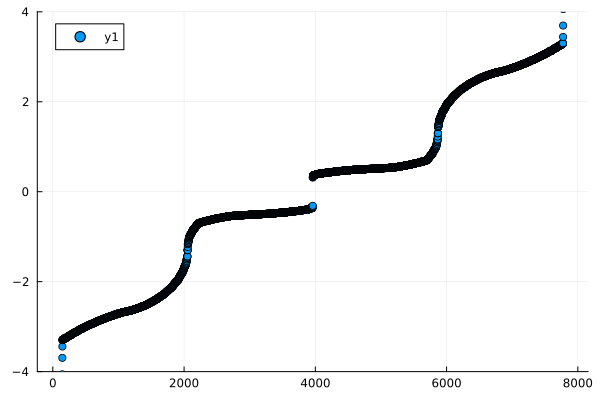

In [49]:
plt2 = scatter(1:NOrbitalsInside, energy_eigenvalues_PTB, ylims=(-4,4))
display(plt2)

In [50]:
isdir(string(folder_path,"energies/")) || mkdir(string(folder_path,"energies/"))

if exportdata==1
    CSV.write(string(folder_path,"energies/",filename), (; energy_eigenvalues_PTB),writeheader=false)
end

"data/topo_super/energies/t0=1.0_t=1.0_m_0=0.0_mu=1.2_Delta=0.5_x_periodic=1_y_periodic=1_L=108_m=0.6666666666666666_c1=4_c2=22.csv"

In [51]:
function state_to_real_space_LDoS(v::Array{ComplexF64})
    n_sites = Int(size(v)[1]/4)
    prob_dist = zeros(n_sites)
    for ii = 1:n_sites
        prob_dist[ii] = abs(v[4*ii-3])^2 +  abs(v[4*ii-2])^2 + abs(v[4*ii-1])^2 + abs(v[4*ii])^2
    end
    return prob_dist
end 

state_to_real_space_LDoS (generic function with 1 method)

## Plot of LDoS of topological states of PTB

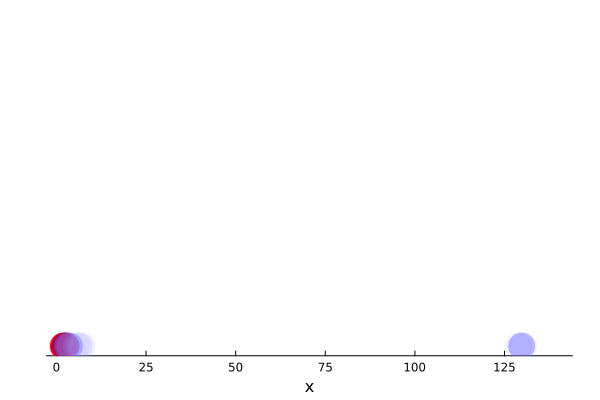

In [52]:
#boundary_state_nearest_zero = eigenstates_PTB[:,N_PTB];
probability_boundary_state = state_to_real_space_LDoS(eigenstates_PTB[:,2*N_PTB]) + state_to_real_space_LDoS(eigenstates_PTB[:,2*N_PTB+1]);

color_map = cgrad([RGB(1,1,1), RGB(0,0,1), RGB(1,0,0)])

# Calculate alphas based on y values
function alpha_function(p, pmax)
    if p < pmax/10
        return 0
    else
        return p/pmax
    end
end
alphas = alpha_function.(probability_boundary_state, maximum(probability_boundary_state))

#plt_PTB_BD_states = scatter(distance_along_projected_line, probability_boundary_state)
plt_PTB_BD_states = scatter(distance_along_projected_line, ones(N_PTB), 
                            zcolor=probability_boundary_state, legend=false, xlabel="x", colorbar_title="Value",
                            c=color_map, ms=15, seriesalpha=alphas, markerstrokewidth=0, grid=false,
                            yaxis=false)

display(plt_PTB_BD_states)

In [53]:
isdir(string(folder_path,"LDOS/")) || mkdir(string(folder_path,"LDOS/"))

if exportdata==1
    CSV.write(string(folder_path,"LDOS/",filename), (; probability_boundary_state),writeheader=false)
end

"data/topo_super/LDOS/t0=1.0_t=1.0_m_0=0.0_mu=1.2_Delta=0.5_x_periodic=1_y_periodic=1_L=108_m=0.6666666666666666_c1=4_c2=22.csv"

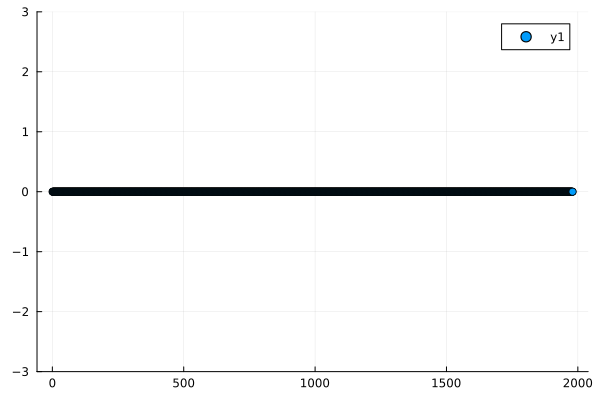

In [54]:
plt_PTB_Chern_marker_sitewise = scatter(1:N_PTB, ChernMatrixSiteWiseList_PTB,ylims=(-3,3),yticks=range(-3,3,7))

### Now I isolate sites on the middle line, and plot their local Chern markers

### For each value of x, I find the site on the PTB closest to the middle line

#### Note that this works only if PTB is thick enough to have more than Lx points

In [55]:
### I generate an array which are the points closest to the middle line
middle_line_x_coordinates = 1:Lx;
middle_line_y_coordinates = round.(line_middle.(float(middle_line_x_coordinates)));

In [56]:
Indices_of_PTB_middle_points = zeros(Lx);
Chern_marker_PTB_list_middle_points = zeros(Lx);

for ii = 1:Lx
    for jj = 1:N_PTB
        if (XList_PTB[jj] == middle_line_x_coordinates[ii]) && (YList_PTB[jj] == middle_line_y_coordinates[ii])
            Indices_of_PTB_middle_points[ii] = PTB_index[jj];
            Chern_marker_PTB_list_middle_points[ii] = ChernMatrixSiteWiseList_PTB[jj];
        end
    end
end


In [57]:
mode_chern = modes(round.(Chern_marker_PTB_list_middle_points))[1]

0.0

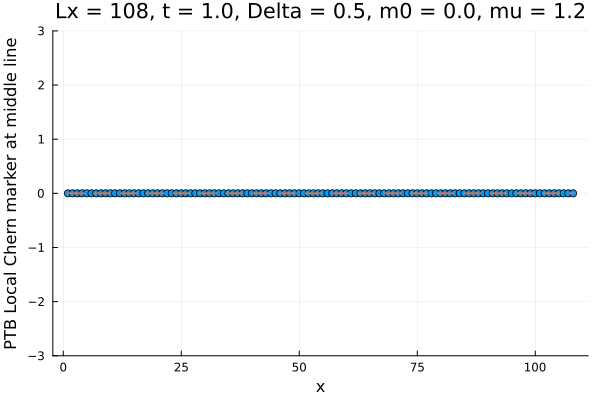

In [58]:
### We will plot the local Chern marker along the line y = Ly/2
plt_Chern_PTB = scatter(1:Lx, Chern_marker_PTB_list_middle_points, ylims=(-3,3), legend=:none,
                xlabel="x", ylabel="PTB Local Chern marker at middle line", 
                title=string("Lx = ", string(Lx), ", t = ", string(t), ", Delta = ", string(Delta), ", m0 = ", string(m_0), ", mu = ", string(mu)))
plt_Chern_PTB = plot!(1:Lx, mode_chern*ones(Lx), linestyle=:dash, thickness=2, linewidth=2)
display(plt_Chern_PTB)

In [59]:
## Print all the Chern markers at the middle line one by one
for ii = 1:Lx
    println("Chern marker at x = ", ii, " is ", Chern_marker_PTB_list_middle_points[ii])
end


Chern marker at x = 1 is -6.441780442401068e-11
Chern marker at x = 2 is -2.326983050693343e-11
Chern marker at x = 3 is 1.269231941769533e-11
Chern marker at x = 4 is -7.281730773911477e-12
Chern marker at x = 5 is 2.6530444507955053e-12
Chern marker at x = 6 is 5.0722204214537214e-12
Chern marker at x = 7 is -4.4999559634106845e-12
Chern marker at x = 8 is -1.5347167980905851e-12
Chern marker at x = 9 is 3.6934344471717395e-12
Chern marker at x = 10 is -5.054456853059719e-12
Chern marker at x = 11 is -9.576173187753056e-12
Chern marker at x = 12 is 5.675626635337494e-12
Chern marker at x = 13 is 3.281652727338269e-12
Chern marker at x = 14 is 9.501510689347015e-12
Chern marker at x = 15 is 4.694911126534862e-12
Chern marker at x = 16 is -4.083733351478713e-12
Chern marker at x = 17 is -5.30431254475161e-12
Chern marker at x = 18 is -4.473588166575837e-12
Chern marker at x = 19 is -1.9271251261443467e-12
Chern marker at x = 20 is -1.0758782753583773e-11
Chern marker at x = 21 is 1.010

In [60]:
isdir(string(folder_path,"local_chern_commute/")) || mkdir(string(folder_path,"local_chern_commute/"))

if exportdata==1
    CSV.write(string(folder_path,"local_chern_commute/",filename), (; Chern_marker_PTB_list_middle_points),writeheader=false)
end

"data/topo_super/local_chern_commute/t0=1.0_t=1.0_m_0=0.0_mu=1.2_Delta=0.5_x_periodic=1_y_periodic=1_L=108_m=0.6666666666666666_c1=4_c2=22.csv"

In [61]:
t_end=time();

In [62]:
println("time taken = ", t_end - t_start," seconds")

time taken = 3369.0630638599396 seconds


In [63]:
t_end-t_start

3369.0630638599396